In [1]:
%%capture
!wget https://raw.githubusercontent.com/B3aRrrr/GreenHouse/main/ddpg_torch.py
!wget https://raw.githubusercontent.com/B3aRrrr/GreenHouse/main/requirements.txt
!wget https://raw.githubusercontent.com/B3aRrrr/GreenHouse/main/utils.py

In [2]:
%%capture
!pip install -r requirements.txt
!apt-get install swig
!pip install gymnasium[box2d]

In [3]:
from ddpg_torch import AgentDDPG
import gym
import numpy as np
from utils import plotLearning,show_video, convert_gif
import os

import glob
from PIL import Image
from gym.wrappers.monitoring.video_recorder import VideoRecorder


from base64 import b64encode

## LunarLanderContinuous

In [4]:
name_env = 'LunarLanderContinuous-v2'
# name_env ="BipedalWalker-v3"
env = gym.make(name_env)


print([*env.observation_space.shape],*env.action_space.shape)

input_dims = [*env.observation_space.shape]
n_actions = env.action_space.shape[0]

print(input_dims,n_actions)


def make_gif(frame_folder,name):
    frames = [Image.open(image) for image in glob.glob(f"{frame_folder}/*.png")]
    frame_one = frames[0]
    frame_one.save(os.path.join(frame_folder,f"{name}.gif"), format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)
def render_mp4(videopath: str) -> str:
  """
  Gets a string containing a b4-encoded version of the MP4 video
  at the specified path.
  """
  mp4 = open(videopath, 'rb').read()
  base64_encoded_mp4 = b64encode(mp4).decode()
  return f'<video width=400 controls><source src="data:video/mp4;' \
         f'base64,{base64_encoded_mp4}" type="video/mp4"></video>'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[8] 2
[8] 2


/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


##### train

In [8]:
agent = AgentDDPG(
    alpha=0.000925,
    beta=0.0000915,
    input_dims=input_dims,
    tau=0.001,env=env,
    rollout_len = 500,
    total_rollouts = 1000,
    batch_size=64,
    layer1_size=400,
    layer2_size=300,
    n_actions=n_actions,
    agent_dir=os.path.join(os.getcwd(),name_env))


The new directory is created!
The new directory is created!
The new directory is created!
The new directory is created!
The new directory is created!


In [9]:
import types

In [10]:
def train(self,plot:bool=False,plot_save = os.path.join(os.getcwd(),'plots',"BipedalWalker-v3")):
    if not os.path.exists(plot_save):
        # Create a new directory because it does not exist
        os.makedirs(plot_save)
    for i in range(self.total_rollouts):
        done = False
        score = 0
        obs = self.env.reset()
        # print(obs)
        step = 0
        while not done:
            act = self.choose_action(obs)
            new_state,reward,done,info = self.env.step(act)
            self.remember(state=obs,action=act,reward=reward,new_state=new_state,done=done)

            self.learn()
            score += reward
            obs = new_state
            step += 1
        self.score_history.append(score)
        print(f'Episode = {i}; score = {round(score, 2)} after {step} steps; 100 game average = {round(np.mean(self.score_history[-100:]), 2)}')
        if i % 25 == 0:
            self.save_models()
        if plot:
            filename = f'{i}.png'
            plotLearning(self.score_history,os.path.join(plot_save,filename),window=100)
    self.env.close()
agent.train = types.MethodType(train, agent)

/content/ddpg_torch.py:185: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x = self.fc1(T.tensor(state, dtype=T.float).to(self.device))


Episode = 0; score = -288.35 after 128 steps; 100 game average = -288.35
...saving checkpoint...
...saving checkpoint...
...saving checkpoint...
...saving checkpoint...
Episode = 1; score = -288.99 after 97 steps; 100 game average = -288.67
Episode = 2; score = -692.63 after 119 steps; 100 game average = -423.32
Episode = 3; score = -341.51 after 87 steps; 100 game average = -402.87
Episode = 4; score = -325.37 after 111 steps; 100 game average = -387.37
Episode = 5; score = -305.44 after 98 steps; 100 game average = -373.71
Episode = 6; score = -272.49 after 96 steps; 100 game average = -359.25
Episode = 7; score = -337.91 after 162 steps; 100 game average = -356.59
Episode = 8; score = -254.27 after 142 steps; 100 game average = -345.22
Episode = 9; score = -158.56 after 68 steps; 100 game average = -326.55
Episode = 10; score = -488.01 after 159 steps; 100 game average = -341.23
Episode = 11; score = -241.64 after 114 steps; 100 game average = -332.93
Episode = 12; score = -446.05 a

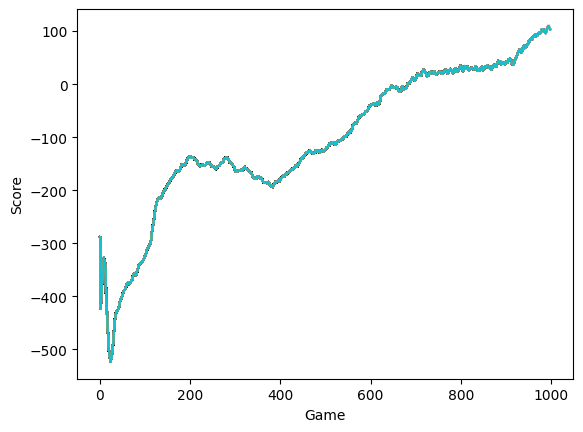

In [11]:
agent.train(True,plot_save=os.path.join(os.getcwd(),'plots',name_env))

In [12]:
make_gif(os.path.join(os.getcwd(),'plots',name_env),name_env)

In [ ]:
!zip -r /content/save.zip /content

### training plot




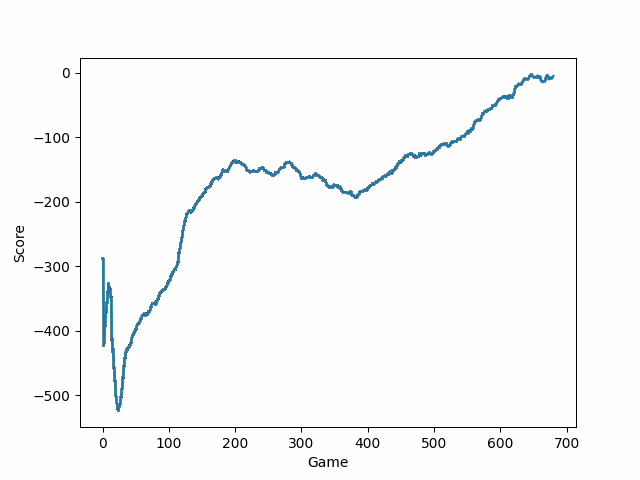

In [22]:
from IPython.display import Image


Image(open(os.path.join(os.getcwd(),'plots',name_env,name_env+ '.gif'),'rb').read())
# img = mpimg.imread(os.path.join(os.getcwd(),'plots',name_env,name_env+ '.gif'))#"/content/animationBrownianMotion2d.gif")
# plt.imshow(img)

### Visualize

In [3]:
%%capture
# install dependencies needed for recording videos
!apt-get install -y xvfb x11-utils
!pip install pyvirtualdisplay==0.2.*

In [4]:
from pyvirtualdisplay import Display
from IPython.display import HTML
from base64 import b64encode
def render_mp4(videopath: str) -> str:
  """
  Gets a string containing a b4-encoded version of the MP4 video
  at the specified path.
  """
  mp4 = open(videopath, 'rb').read()
  base64_encoded_mp4 = b64encode(mp4).decode()
  return f'<video width=400 controls><source src="data:video/mp4;' \
         f'base64,{base64_encoded_mp4}" type="video/mp4"></video>'

display = Display(visible=False, size=(1400, 900))
_ = display.start()

In [5]:
env_copy = env

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### BEFORE training

In [9]:
from gym.wrappers.monitoring.video_recorder import VideoRecorder
before_training = f"before_training.mp4"

video = VideoRecorder(env, before_training)


env_copy.reset()


for i in range(5000):
  env_copy.render()
  video.capture_frame()
  action = env_copy.action_space.sample()
  # action = agent.choose_action(observation)
  observation, reward, done, info = env_copy.step(action)
  # Not printing this time
  #print("step", i, observation, reward, done, info)

video.close()
env_copy.close()

/usr/local/lib/python3.10/dist-packages/gym/wrappers/monitoring/video_recorder.py:78: DeprecationWarning: WARN: Recording ability for environment LunarLanderContinuous-v2 initialized with `render_mode=None` is marked as deprecated and will be removed in the future.
  logger.deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/monitoring/video_recorder.py:101: DeprecationWarning: WARN: <class 'gym.wrappers.monitoring.video_recorder.VideoRecorder'> is marked as deprecated and will be removed in the future.
  logger.deprecation(
/usr/local/lib/python3.10/dist-packages/gym/core.py:49: DeprecationWarning: WARN: You are calling render method, but you didn't specified the argument render_mode at environment initialization. To maintain backward compatibility, the environment will render in human mode.
If you want to render in human mode, initialize the environment in this way: gym.make('EnvName', render_mode='human') and don't call the render method.
See here for more information:

In [11]:
html = render_mp4(before_training)
HTML(html)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### AFTER training

In [6]:
after_training = f"DDPG_{name_env}_training.mp4"

video = VideoRecorder(env, after_training)
agent = AgentDDPG(
    alpha=0.000925,
    beta=0.0000915,
    input_dims=input_dims,
    tau=0.001,env=env_copy,
    rollout_len = 500,
    total_rollouts = 1000,
    batch_size=64,
    layer1_size=400,
    layer2_size=300,
    n_actions=n_actions,
    agent_dir=os.path.join(os.getcwd(),name_env))

agent.load_models()
# returns an initial observation
observation=env.reset()


for i in range(5000):
  env_copy.render()
  video.capture_frame()
  # action = env_copy.action_space.sample()
  action = agent.choose_action(observation)
  observation, reward, done, info = env_copy.step(action)
  # Not printing this time
  #print("step", i, observation, reward, done, info)

video.close()
env_copy.close()

/usr/local/lib/python3.10/dist-packages/gym/wrappers/monitoring/video_recorder.py:78: DeprecationWarning: WARN: Recording ability for environment LunarLanderContinuous-v2 initialized with `render_mode=None` is marked as deprecated and will be removed in the future.
  logger.deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/monitoring/video_recorder.py:101: DeprecationWarning: WARN: <class 'gym.wrappers.monitoring.video_recorder.VideoRecorder'> is marked as deprecated and will be removed in the future.
  logger.deprecation(


...loading checkpoint...
...loading checkpoint...
...loading checkpoint...
...loading checkpoint...


/usr/local/lib/python3.10/dist-packages/gym/core.py:49: DeprecationWarning: WARN: You are calling render method, but you didn't specified the argument render_mode at environment initialization. To maintain backward compatibility, the environment will render in human mode.
If you want to render in human mode, initialize the environment in this way: gym.make('EnvName', render_mode='human') and don't call the render method.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/content/ddpg_torch.py:185: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourc

In [7]:
html = render_mp4(after_training)
HTML(html)

In [8]:
!zip -r /content/save.zip /content

updating: content/ (stored 0%)
updating: content/.config/ (stored 0%)
updating: content/.config/logs/ (stored 0%)
updating: content/.config/logs/2023.09.14/ (stored 0%)
updating: content/.config/logs/2023.09.14/13.23.06.916289.log (deflated 56%)
updating: content/.config/logs/2023.09.14/13.22.33.668588.log (deflated 86%)
updating: content/.config/logs/2023.09.14/13.22.40.967663.log (deflated 57%)
updating: content/.config/logs/2023.09.14/13.23.06.154072.log (deflated 57%)
updating: content/.config/logs/2023.09.14/13.22.09.213761.log (deflated 58%)
updating: content/.config/logs/2023.09.14/13.21.42.998569.log (deflated 91%)
updating: content/.config/gce (stored 0%)
updating: content/.config/config_sentinel (stored 0%)
updating: content/.config/.last_opt_in_prompt.yaml (stored 0%)
updating: content/.config/.last_survey_prompt.yaml (stored 0%)
updating: content/.config/configurations/ (stored 0%)
updating: content/.config/configurations/config_default (deflated 15%)
updating: content/.con

## BipedalWalker